# Prepare Google Colab Environment

In [1]:
!git clone https://github.com/mhamilton723/STEGO.git

Cloning into 'STEGO'...
remote: Enumerating objects: 186, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 186 (delta 13), reused 12 (delta 12), pack-reused 169
Receiving objects: 100% (186/186), 9.09 MiB | 27.21 MiB/s, done.
Resolving deltas: 100% (93/93), done.


In [2]:
!pip install wget
!pip install torchmetrics
!pip install hydra-core
!pip install git+https://github.com/lucasb-eyer/pydensecrf.git
!pip install omegaconf
!pip install pytorch-lightning

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=1c215adb5a90d624606d82fa5cb3244020941f8ca5ee764c40d0564ae943a04a
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
     |████████████████████████████████| 409 kB 12.7 MB/s 
     |████████████████████████████████| 147 kB 11.9 MB/s 
     |████████████████████████████████| 112 kB 51.6 MB/s 
     |████████████████████████████████| 74 kB 3.3 MB/s 
     |████████████████████████████████| 596 kB 48.8 MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=4d429bacd05f94c444048255f4f65943789786749afb53ea0334fdea0ced6b0e
  Stored in directory: /root/.cache/pip/wheels/ca/33/b7/336836125fc9bb4ceaa4376d8abca10ca8bc84ddc824baea6c
Successfully built antlr4-python3-runtime
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
  

  Cloning https://github.com/lucasb-eyer/pydensecrf.git to /tmp/pip-req-build-3adgxynl
  Running command git clone -q https://github.com/lucasb-eyer/pydensecrf.git /tmp/pip-req-build-3adgxynl
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for pydensecrf: filename=pydensecrf-1.0rc2-cp37-cp37m-linux_x86_64.whl size=2778822 sha256=0b3f064e62ce8efc75cb00549101aa6530564035b69baeae1be9d0a9020860e3
  Stored in directory: /tmp/pip-ephem-wheel-cache-oqy9hkud/wheels/c1/7e/80/99adc0b2f215180486e24dd9c700028343ba5f566514a0ef05
Successfully built pydensecrf
     |████████████████████████████████| 584 kB 11.4 MB/s 
     |████████████████████████████████| 136 kB 50.7 MB/s 
     |████████████████████████████████| 1.1 MB 46.7 MB/s 
     |████████████████████████████████| 271 kB 56.3 MB/s 
     |████████████████████████████████| 94 kB 3.6 MB/s 
     |████████████████████████████████| 144 kB 54.8 MB/s 


# Download Pretrained Model



In [2]:
import os
from os.path import join
# os.chdir("STEGO/src")
saved_models_dir = join("..", "saved_models")
# os.makedirs(saved_models_dir, exist_ok=True)

In [3]:
import wget
# saved_model_url_root = "https://marhamilresearch4.blob.core.windows.net/stego-public/saved_models/"
saved_model_name = "potsdam_test.ckpt"
# if not os.path.exists(join(saved_models_dir, saved_model_name)):
  # wget.download(saved_model_url_root + saved_model_name, join(saved_models_dir, saved_model_name))

# Load pretrained STEGO

In [4]:
from train_segmentation import LitUnsupervisedSegmenter

model = LitUnsupervisedSegmenter.load_from_checkpoint(join(saved_models_dir, saved_model_name)).cuda()

/home/felix/miniconda3/envs/stego/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/felix/Unsupervised-Segmentation-for-Autonomous-Driving-Cars/STEGO/src/train_segmentation.py:423: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  @hydra.main(config_path="configs", config_name="train_config.yml")


FileNotFoundError: [Errno 2] No such file or directory: '/home/felix/Unsupervised-Segmentation-for-Autonomous-Driving-Cars/STEGO/src/../saved_models/potsdam_test.ckpt'

# Load Image

In [ ]:
from PIL import Image
import cv2
import torch
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_tensor
from utils import get_transform
import os

dir = "logs/checkpoints/stego_test_9/directory_carla_custom_1_clusterWarmup_L2_nclasses20_date_Jul15_14-27-25/"
sav_model = "epoch=24-step=14399.ckpt"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LitUnsupervisedSegmenter.load_from_checkpoint(join(dir, sav_model)).to(device).eval()

# Define the video path
vid_path = "../../testing_videos/"
video = "vid_town10HD_small_crash.mp4"
video_path = os.path.join(vid_path, video)

# Open the video file
cap = cv2.VideoCapture(video_path)

# Check if the video was opened successfully
if not cap.isOpened():
    print(f"Error: Could not open video {video_path}")
    exit()

# Read the first frame
ret, frame = cap.read()

if ret:
    # Convert the frame to RGB (OpenCV uses BGR by default)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Convert the frame to a PIL Image
    pil_image = Image.fromarray(frame_rgb)
    
    # Convert the PIL Image to a tensor
    tensor_image = to_tensor(pil_image)
    
    # Now tensor_image is the first frame as a tensor variable
    print(f"First frame as tensor: {tensor_image.shape}")
    
    # Display the image using matplotlib
    plt.imshow(frame_rgb)
    plt.title("First Frame of the Video")
    plt.axis('off')
    plt.show()
else:
    print("Error: Could not read the first frame")

# Release the video capture object
cap.release()

import torch.nn.functional as F
from crf import dense_crf
import torch


transform = get_transform(448, False, "center")
img = transform(pil_image).unsqueeze(0).cuda()


with torch.no_grad():
  code1 = model(img)
  code2 = model(img.flip(dims=[3]))
  code  = (code1 + code2.flip(dims=[3])) / 2
  code = F.interpolate(code, img.shape[-2:], mode='bilinear', align_corners=False)
  linear_probs = torch.log_softmax(model.linear_probe(code), dim=1).cpu()
  cluster_probs = model.cluster_probe(code, 2, log_probs=True).cpu()

  single_img = img[0].cpu()
  linear_pred = dense_crf(single_img, linear_probs[0]).argmax(0)
  cluster_pred = dense_crf(single_img, cluster_probs[0]).argmax(0)

import matplotlib.pyplot as plt
from utils import unnorm, remove_axes

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Display the images with correct aspect ratio
ax[0].imshow(unnorm(img)[0].permute(1, 2, 0).cpu(), aspect='auto', extent=[0, img.shape[2], 0, img.shape[1]])
ax[0].set_title("Image")
ax[1].imshow(model.label_cmap[cluster_pred], aspect='auto', extent=[0, cluster_pred.shape[1], 0, cluster_pred.shape[0]])
ax[1].set_title("Cluster Predictions")
ax[2].imshow(model.label_cmap[linear_pred], aspect='auto', extent=[0, linear_pred.shape[1], 0, linear_pred.shape[0]])
ax[2].set_title("Linear Probe Predictions")

# Remove the axes for a cleaner look
remove_axes(ax)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


# Query model and pass result through CRF

In [ ]:
import torch.nn.functional as F
from crf import dense_crf
import torch

img2 = pil_image

plt.imshow(img2)

transform = get_transform(448, False, "center")
img = transform(img2).unsqueeze(0).cuda()



with torch.no_grad():
  code1 = model(img)
  code2 = model(img.flip(dims=[3]))
  code  = (code1 + code2.flip(dims=[3])) / 2
  code = F.interpolate(code, img.shape[-2:], mode='bilinear', align_corners=False)
  linear_probs = torch.log_softmax(model.linear_probe(code), dim=1).cpu()
  cluster_probs = model.cluster_probe(code, 2, log_probs=True).cpu()

  single_img = img[0].cpu()
  linear_pred = dense_crf(single_img, linear_probs[0]).argmax(0)
  cluster_pred = dense_crf(single_img, cluster_probs[0]).argmax(0)

import matplotlib.pyplot as plt
from utils import unnorm, remove_axes

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Display the images with correct aspect ratio
ax[0].imshow(unnorm(img)[0].permute(1, 2, 0).cpu(), aspect='auto', extent=[0, img.shape[2], 0, img.shape[1]])
ax[0].set_title("Image")
ax[1].imshow(model.label_cmap[cluster_pred], aspect='auto', extent=[0, cluster_pred.shape[1], 0, cluster_pred.shape[0]])
ax[1].set_title("Cluster Predictions")
ax[2].imshow(model.label_cmap[linear_pred], aspect='auto', extent=[0, linear_pred.shape[1], 0, linear_pred.shape[0]])
ax[2].set_title("Linear Probe Predictions")

# Remove the axes for a cleaner look
remove_axes(ax)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


# Visualize Result

Note that cluster predictions will not be matched with ground truth classes in this example. For hungarian matching please use: `eval_segmentation.py`

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


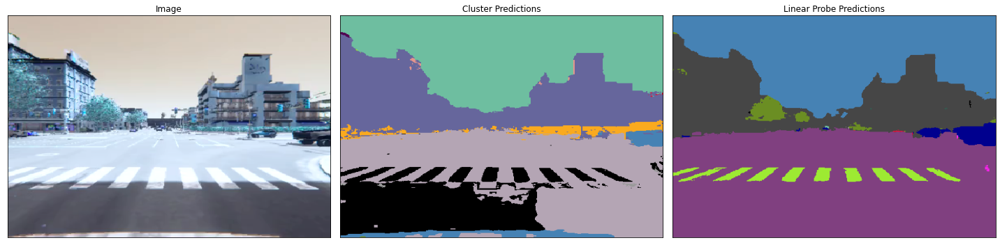

In [25]:
saved_model_name = "cocostuff27_vit_base_5.ckpt"
model = LitUnsupervisedSegmenter.load_from_checkpoint(join(saved_models_dir, saved_model_name)).cuda()

FileNotFoundError: [Errno 2] No such file or directory: '/home/felix/Unsupervised-Segmentation-for-Autonomous-Driving-Cars/STEGO/src/../saved_models/cocostuff27_vit_base_5.ckpt'

In [53]:
import torch.nn.functional as F
from crf import dense_crf
import torch

with torch.no_grad():
  code1 = model(img)
  code2 = model(img.flip(dims=[3]))
  code  = (code1 + code2.flip(dims=[3])) / 2
  code = F.interpolate(code, img.shape[-2:], mode='bilinear', align_corners=False)
  linear_probs = torch.log_softmax(model.linear_probe(code), dim=1).cpu()
  cluster_probs = model.cluster_probe(code, 2, log_probs=True).cpu()

  single_img = img[0].cpu()
  linear_pred = dense_crf(single_img, linear_probs[0]).argmax(0)
  cluster_pred = dense_crf(single_img, cluster_probs[0]).argmax(0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


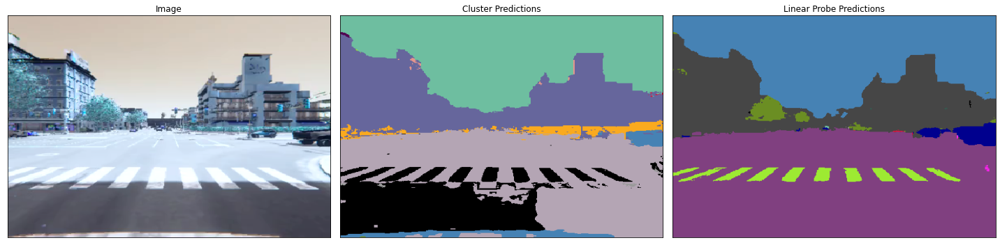

In [54]:
import matplotlib.pyplot as plt
from utils import unnorm, remove_axes

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Display the images with correct aspect ratio
ax[0].imshow(unnorm(img)[0].permute(1, 2, 0).cpu(), aspect='auto', extent=[0, img.shape[2], 0, img.shape[1]])
ax[0].set_title("Image")
ax[1].imshow(model.label_cmap[cluster_pred], aspect='auto', extent=[0, cluster_pred.shape[1], 0, cluster_pred.shape[0]])
ax[1].set_title("Cluster Predictions")
ax[2].imshow(model.label_cmap[linear_pred], aspect='auto', extent=[0, linear_pred.shape[1], 0, linear_pred.shape[0]])
ax[2].set_title("Linear Probe Predictions")

# Remove the axes for a cleaner look
remove_axes(ax)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


In [17]:
saved_model_name = "cityscapes_vit_base_1.ckpt"
model = LitUnsupervisedSegmenter.load_from_checkpoint(join(saved_models_dir, saved_model_name)).cuda()

Since no pretrained weights have been provided, we load the reference pretrained DINO weights.


In [28]:
import torch.nn.functional as F
from crf import dense_crf
import torch

with torch.no_grad():
  code1 = model(img)
  code2 = model(img.flip(dims=[3]))
  code  = (code1 + code2.flip(dims=[3])) / 2
  code = F.interpolate(code, img.shape[-2:], mode='bilinear', align_corners=False)
  linear_probs = torch.log_softmax(model.linear_probe(code), dim=1).cpu()
  cluster_probs = model.cluster_probe(code, 2, log_probs=True).cpu()

  single_img = img[0].cpu()
  linear_pred = dense_crf(single_img, linear_probs[0]).argmax(0)
  cluster_pred = dense_crf(single_img, cluster_probs[0]).argmax(0)


fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Display the images with correct aspect ratio
ax[0].imshow(unnorm(img)[0].permute(1, 2, 0).cpu(), aspect='auto', extent=[0, img.shape[2], 0, img.shape[1]])
ax[0].set_title("Image", color='white')
ax[1].imshow(model.label_cmap[cluster_pred], aspect='auto', extent=[0, cluster_pred.shape[1], 0, cluster_pred.shape[0]])
ax[1].set_title("Cluster Predictions", color='white')
ax[2].imshow(model.label_cmap[linear_pred], aspect='auto', extent=[0, linear_pred.shape[1], 0, linear_pred.shape[0]])
ax[2].set_title("Linear Probe Predictions", color='white')

# Remove the axes for a cleaner look
remove_axes(ax)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


AssertionError: 

In [14]:
saved_model_name = "cityscapes_vit_base_1.ckpt"
model4 = LitUnsupervisedSegmenter.load_from_checkpoint(join(saved_models_dir, saved_model_name)).cuda()


Since no pretrained weights have been provided, we load the reference pretrained DINO weights.


In [37]:
dir = "logs/checkpoints/stego_test_3/directory_exp4_ms5000_nclass28_dim70_date_Jun18_19-14-27/"
sav_model = "epoch=1-step=4399.ckpt"
model0 = LitUnsupervisedSegmenter.load_from_checkpoint(join(dir, sav_model)).cuda()

dir = "logs/checkpoints/stego_test_3/directory_exp5_ms5000_nclass8_dim70_date_Jun19_00-14-50"
sav_model = "epoch=0-step=1199.ckpt"
model1 = LitUnsupervisedSegmenter.load_from_checkpoint(join(dir, sav_model)).cuda()

dir = "logs/checkpoints/stego_test_3/directory_exp6_ms5000_nclass6_dim70_date_Jun19_11-34-35"
sav_model = "epoch=1-step=2399.ckpt"
model2 = LitUnsupervisedSegmenter.load_from_checkpoint(join(dir, sav_model)).cuda()

dir = "logs/checkpoints/stego_test_3/directory_exp7_ms5000_nclass6_dim128_date_Jun19_16-09-50"
sav_model = "epoch=0-step=799.ckpt"
model3 = LitUnsupervisedSegmenter.load_from_checkpoint(join(dir, sav_model)).cuda()

lst_m = [model0, model1, model2, model3]

Since no pretrained weights have been provided, we load the reference pretrained DINO weights.
Since no pretrained weights have been provided, we load the reference pretrained DINO weights.
Since no pretrained weights have been provided, we load the reference pretrained DINO weights.
Since no pretrained weights have been provided, we load the reference pretrained DINO weights.


/home/fhoekstra/miniconda3/envs/stego/lib/python3.6/site-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bicubic is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/home/fhoekstra/miniconda3/envs/stego/lib/python3.6/site-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "


(800, 400)


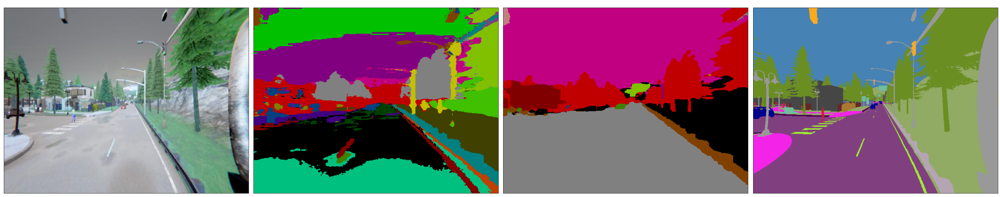

Linear Probe IoU: 0.8981983418367347
Cluster Probe IoU: 0.8417370854591837
(800, 400)


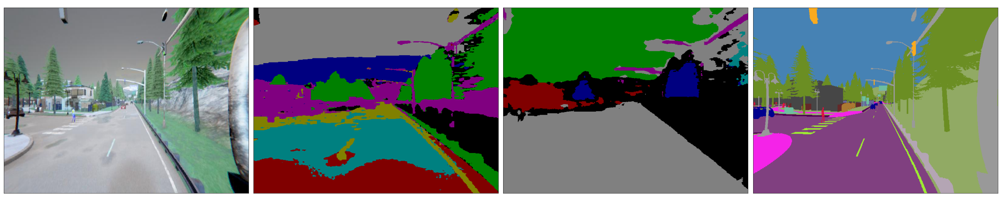

Linear Probe IoU: 0.7727798150510204
Cluster Probe IoU: 0.9138781489158163
(800, 400)


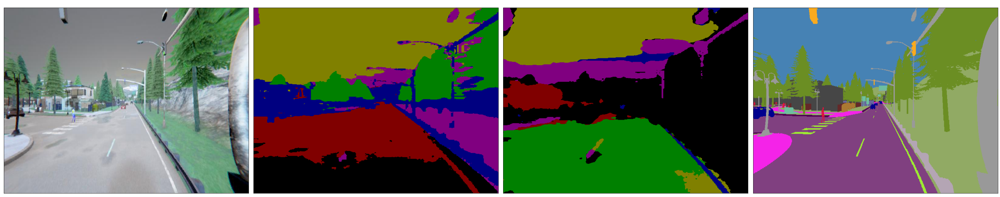

Linear Probe IoU: 0.6414471061862245
Cluster Probe IoU: 0.8213787468112245
(800, 400)


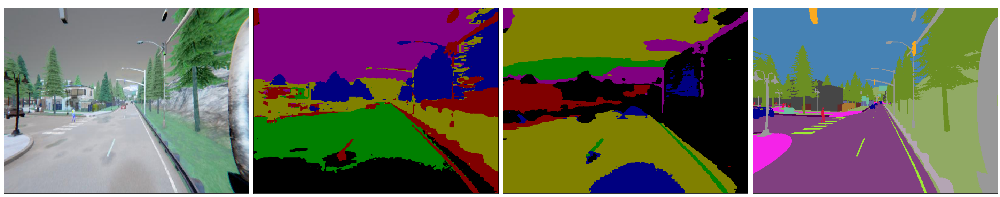

Linear Probe IoU: 0.7089096380739796
Cluster Probe IoU: 0.8349360251913265
(800, 400)


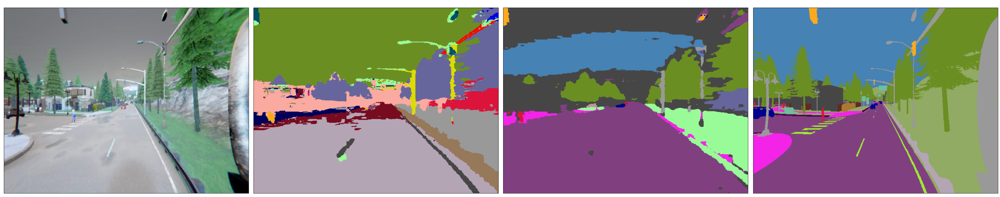

Linear Probe IoU: 0.6338189572704082
Cluster Probe IoU: 0.9994718590561225


In [19]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os
from os.path import join
from train_segmentation import LitUnsupervisedSegmenter
from utils import get_transform, unnorm, remove_axes
from crf import dense_crf

# Paths and model loading
dir = "src/logs/checkpoints/stego_test_3/directory_exp4_ms5000_nclass28_dim70_date_Jun18_19-14-27/"
sav_model = "epoch=1-step=4399.ckpt"
model0 = LitUnsupervisedSegmenter.load_from_checkpoint(join(dir, sav_model)).cuda()

video_path = "testing_data/vid_obirzycmnl_test_run.mp4"
output_dir = "testing_data/frames"
segmented_output_dir = "testing_data/segmented_frames"
output_video_path = "testing_data/segmented_video.mp4"

def extract_frames(video_path, output_dir):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    success, frame = cap.read()
    count = 0

    os.makedirs(output_dir, exist_ok=True)

    while success:
        frame_path = os.path.join(output_dir, f"frame_{count:04d}.png")
        cv2.imwrite(frame_path, frame)
        success, frame = cap.read()
        count += 1

    cap.release()
    return frame_count, output_dir

def process_frame_with_stego(frame, model):
    transform = get_transform(448, False, "center")  # Adjust the transform as necessary
    frame_tensor = transform(Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))).unsqueeze(0).cuda()

    with torch.no_grad():
        code1 = model(frame_tensor)
        code2 = model(frame_tensor.flip(dims=[3]))
        code = (code1 + code2.flip(dims=[3])) / 2
        code = F.interpolate(code, frame_tensor.shape[-2:], mode='bilinear', align_corners=False)
        linear_probs = torch.log_softmax(model.linear_probe(code), dim=1).cpu()
        cluster_probs = model.cluster_probe(code, 2, log_probs=True).cpu()

        single_img = frame_tensor[0].cpu()
        linear_pred = dense_crf(single_img, linear_probs[0]).argmax(0)
        cluster_pred = dense_crf(single_img, cluster_probs[0]).argmax(0)

    # Assuming cluster_pred is the desired output
    segmented_frame = model.label_cmap[cluster_pred]
    return segmented_frame

def combine_frames_to_video(frame_dir, output_video_path, fps=20):
    frame_files = sorted([f for f in os.listdir(frame_dir) if f.endswith(".png")])
    if not frame_files:
        print(f"No frames to combine in {frame_dir}.")
        return

    first_frame = cv2.imread(os.path.join(frame_dir, frame_files[0]))
    height, width, layers = first_frame.shape

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for frame_file in frame_files:
        frame = cv2.imread(os.path.join(frame_dir, frame_file))
        video.write(frame)

    video.release()

# Extract frames from video
frame_count, frame_dir = extract_frames(video_path, output_dir)
print(f"Extracted {frame_count} frames to {frame_dir}")

# Verify frames are extracted
extracted_frames = sorted(os.listdir(frame_dir))
print(f"Extracted frames: {extracted_frames[:10]}")  # Print first 10 frames for verification

# Process each frame with STEGO
os.makedirs(segmented_output_dir, exist_ok=True)
for frame_file in extracted_frames:
    frame_path = os.path.join(frame_dir, frame_file)
    frame = cv2.imread(frame_path)

    if frame is None:
        print(f"Failed to read frame {frame_path}")
        continue

    # Process frame with STEGO model
    segmented_frame = process_frame_with_stego(frame, model0)

    # Save segmented frame
    segmented_frame_path = os.path.join(segmented_output_dir, frame_file)
    cv2.imwrite(segmented_frame_path, cv2.cvtColor(segmented_frame, cv2.COLOR_RGB2BGR))

# Verify segmented frames are saved
segmented_frames = sorted(os.listdir(segmented_output_dir))
print(f"Segmented frames: {segmented_frames[:10]}")  # Print first 10 segmented frames for verification

# Combine segmented frames into video
combine_frames_to_video(segmented_output_dir, output_video_path)


In [99]:
# Define the mapping from Cityscapes trainId to CARLA label value
cityscapes_to_carla = {
    0: 1,   # 'road' in Cityscapes to 'Roads' in CARLA
    1: 2,   # 'sidewalk' in Cityscapes to 'SideWalks' in CARLA
    2: 3,   # 'building' in Cityscapes to 'Building' in CARLA
    3: 4,   # 'wall' in Cityscapes to 'Wall' in CARLA
    4: 5,   # 'fence' in Cityscapes to 'Fence' in CARLA
    5: 6,   # 'pole' in Cityscapes to 'Pole' in CARLA
    6: 7,   # 'traffic light' in Cityscapes to 'TrafficLight' in CARLA
    7: 8,   # 'traffic sign' in Cityscapes to 'TrafficSign' in CARLA
    8: 9,   # 'vegetation' in Cityscapes to 'Vegetation' in CARLA
    9: 10,  # 'terrain' in Cityscapes to 'Terrain' in CARLA
    10: 11, # 'sky' in Cityscapes to 'Sky' in CARLA
    11: 12, # 'person' in Cityscapes to 'Pedestrian' in CARLA
    12: 13, # 'rider' in Cityscapes to 'Rider' in CARLA
    13: 14, # 'car' in Cityscapes to 'Car' in CARLA
    14: 15, # 'truck' in Cityscapes to 'Truck' in CARLA
    15: 16, # 'bus' in Cityscapes to 'Bus' in CARLA
    16: 17, # 'train' in Cityscapes to 'Train' in CARLA
    17: 18, # 'motorcycle' in Cityscapes to 'Motorcycle' in CARLA
    18: 19, # 'bicycle' in Cityscapes to 'Bicycle' in CARLA
    # Add more mappings as needed
}


Since no pretrained weights have been provided, we load the reference pretrained DINO weights.
First frame as tensor: torch.Size([3, 400, 800])


/home/felix/miniconda3/envs/stego/lib/python3.6/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                not been set for this class (UnsupervisedMetrics). The property determines if `update` by
                default needs access to the full metric state. If this is not the case, significant speedups can be
                achieved and we recommend setting this to `False`.
                We provide an checking function
                `from torchmetrics.utilities import check_forward_full_state_property`
                that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                default for now) or if `full_state_update=False` can be used safely.
                
  warnings.warn(*args, **kwargs)


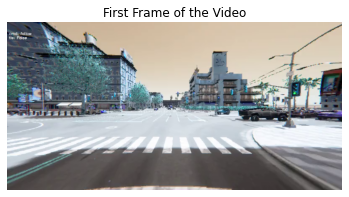

<PIL.Image.Image image mode=RGB size=800x400 at 0x7DAC6AD1F320>
(400, 800, 3)


/home/felix/miniconda3/envs/stego/lib/python3.6/site-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/home/felix/miniconda3/envs/stego/lib/python3.6/site-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bicubic is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/home/felix/miniconda3/envs/stego/lib/python3.6/site-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output s

960000


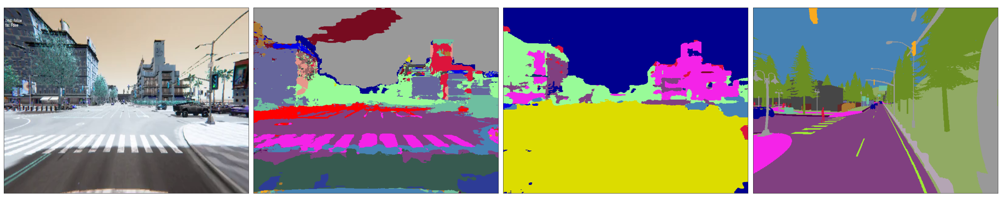

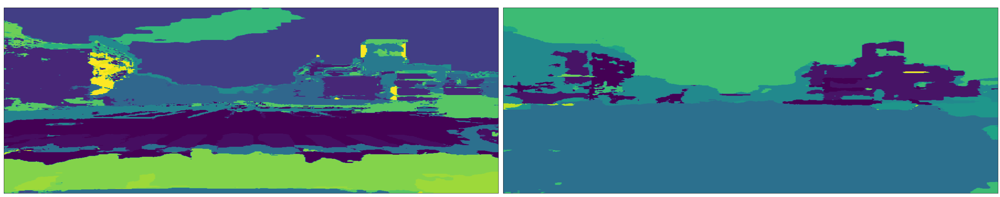

Linear Probe IoU: 1.0
Cluster Probe IoU: 1.0
960000


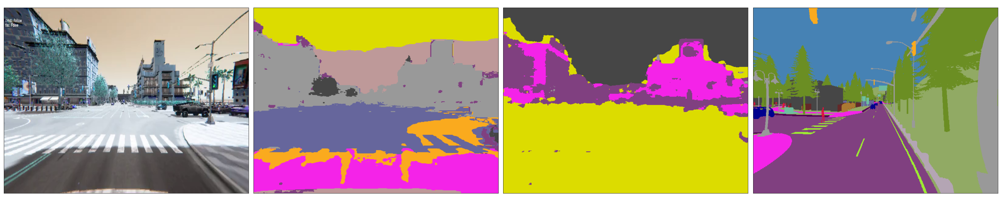

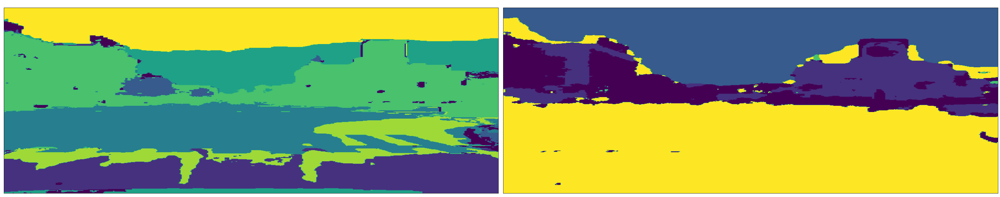

Linear Probe IoU: 1.0
Cluster Probe IoU: 1.0
960000


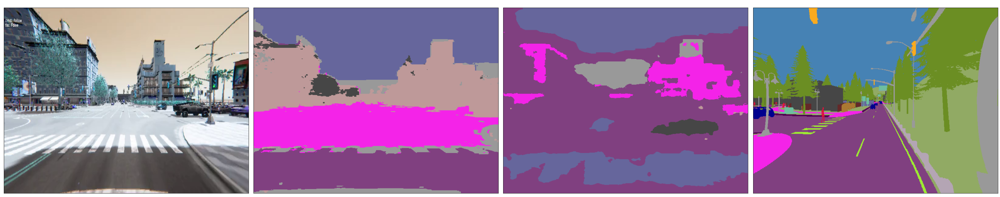

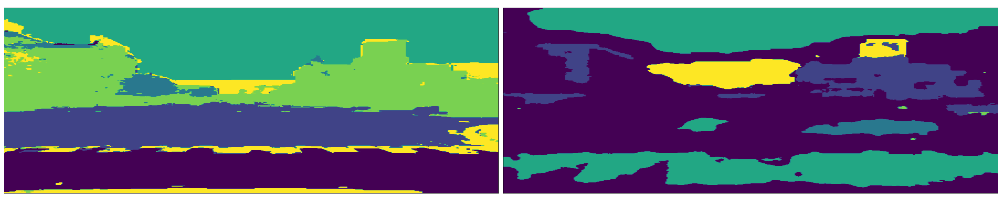

Linear Probe IoU: 1.0
Cluster Probe IoU: 1.0
960000


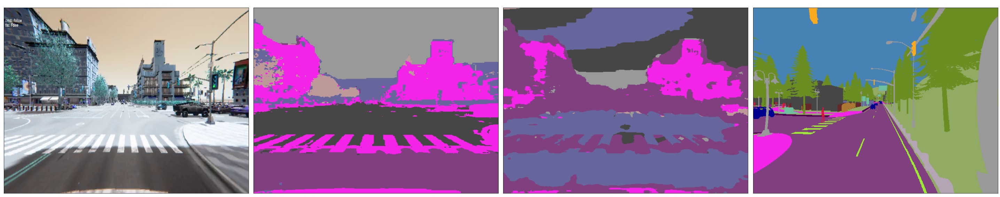

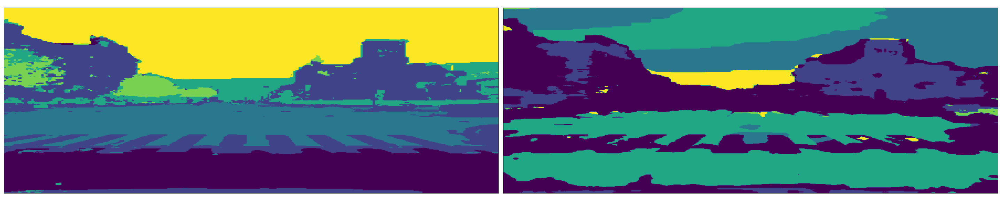

Linear Probe IoU: 1.0
Cluster Probe IoU: 1.0


In [42]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image

# Define the mapping from Cityscapes trainId to CARLA label value
cityscapes_to_carla = {
    0: 1,   # 'road' in Cityscapes to 'Roads' in CARLA
    1: 2,   # 'sidewalk' in Cityscapes to 'SideWalks' in CARLA
    2: 3,   # 'building' in Cityscapes to 'Building' in CARLA
    3: 4,   # 'wall' in Cityscapes to 'Wall' in CARLA
    4: 5,   # 'fence' in Cityscapes to 'Fence' in CARLA
    5: 6,   # 'pole' in Cityscapes to 'Pole' in CARLA
    6: 7,   # 'traffic light' in Cityscapes to 'TrafficLight' in CARLA
    7: 8,   # 'traffic sign' in Cityscapes to 'TrafficSign' in CARLA
    8: 9,   # 'vegetation' in Cityscapes to 'Vegetation' in CARLA
    9: 10,  # 'terrain' in Cityscapes to 'Terrain' in CARLA
    10: 11, # 'sky' in Cityscapes to 'Sky' in CARLA
    11: 12, # 'person' in Cityscapes to 'Pedestrian' in CARLA
    12: 13, # 'rider' in Cityscapes to 'Rider' in CARLA
    13: 14, # 'car' in Cityscapes to 'Car' in CARLA
    14: 15, # 'truck' in Cityscapes to 'Truck' in CARLA
    15: 16, # 'bus' in Cityscapes to 'Bus' in CARLA
    16: 17, # 'train' in Cityscapes to 'Train' in CARLA
    17: 18, # 'motorcycle' in Cityscapes to 'Motorcycle' in CARLA
    18: 19, # 'bicycle' in Cityscapes to 'Bicycle' in CARLA
    # Add more mappings as needed
}

# Define CARLA color map
carla_colormap = {
    0: (0, 0, 0),
    1: (128, 64, 128),
    2: (244, 35, 232),
    3: (70, 70, 70),
    4: (102, 102, 156),
    5: (190, 153, 153),
    6: (153, 153, 153),
    7: (250, 170, 30),
    8: (220, 220, 0),
    9: (107, 142, 35),
    10: (152, 251, 152),
    11: (70, 130, 180),
    12: (220, 20, 60),
    13: (255, 0, 0),
    14: (0, 0, 142),
    15: (0, 0, 70),
    16: (0, 60, 100),
    17: (0, 80, 100),
    18: (0, 0, 230),
    19: (119, 11, 32),
    20: (110, 190, 160),
    21: (170, 120, 50),
    22: (55, 90, 80),
    23: (45, 60, 150),
    24: (157, 234, 50),
    25: (81, 0, 81),
    26: (150, 100, 100),
    27: (230, 150, 140),
    28: (180, 165, 180)
}

def convert_labels(pred, mapping):
    """Convert prediction labels using the provided mapping."""
    converted_pred = np.copy(pred)
    for city_label, carla_label in mapping.items():
        converted_pred[pred == city_label] = carla_label
    return converted_pred

def apply_colormap(pred, colormap):
    """Apply a colormap to the prediction labels."""
    colored_image = np.zeros((pred.shape[0], pred.shape[1], 3), dtype=np.uint8)
    for label, color in colormap.items():
        colored_image[pred == label] = color
    return colored_image

def calculate_iou(pred, gt):
    intersection = np.logical_and(pred, gt)
    union = np.logical_or(pred, gt)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score


dir = "logs/checkpoints/stego_test_9/directory_carla_custom_1_clusterWarmup_L2_nclasses20_date_Jul15_14-27-25/"
sav_model = "epoch=24-step=14399.ckpt"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LitUnsupervisedSegmenter.load_from_checkpoint(join(dir, sav_model)).to(device).eval()

# Define the video path
vid_path = "../../testing_videos/"
video = "vid_town10HD_small_crash.mp4"
video_path = os.path.join(vid_path, video)

# Open the video file
cap = cv2.VideoCapture(video_path)

# Check if the video was opened successfully
if not cap.isOpened():
    print(f"Error: Could not open video {video_path}")
    exit()

# Read the first frame
ret, frame = cap.read()

if ret:
    # Convert the frame to RGB (OpenCV uses BGR by default)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Convert the frame to a PIL Image
    pil_image = Image.fromarray(frame_rgb)
    
    # Convert the PIL Image to a tensor
    tensor_image = to_tensor(pil_image)
    
    # Now tensor_image is the first frame as a tensor variable
    print(f"First frame as tensor: {tensor_image.shape}")
    
    # Display the image using matplotlib
    plt.imshow(frame_rgb)
    plt.title("First Frame of the Video")
    plt.axis('off')
    plt.show()
else:
    print("Error: Could not read the first frame")

# Release the video capture object
cap.release()

j = 28
i = 239
# Load and transform the images
img_path = '/storage/felix/Afstudeerproject/small_800-400_R07/imgs/train/train_'+ str(j)+ '_'+ str(i)+ '_bird_view_frame_RGB.jpg'
img = pil_image
og_img = img

transform = get_transform(448, False, "center")
img = transform(img).unsqueeze(0).cuda()


gt_img_path = '/storage/felix/Afstudeerproject/small_800-400_R07/labels/train/lab_train_'+ str(j)+ '_'+ str(i)+'_bird_view_frame_SEG.png'
gt_img = Image.open(gt_img_path)
og_gt = gt_img

print(og_img)

og_img = frame_rgb

print(og_img.shape)
# gt_img_red_channel = np.array(gt_img)[:, :, 0]
gt_img = transform(gt_img).unsqueeze(0).cpu()

for model in lst_m:
    # Make predictions
    with torch.no_grad():
        code1 = model(img)
        code2 = model(img.flip(dims=[3]))
        code = (code1 + code2.flip(dims=[3])) / 2
        code = F.interpolate(code, img.shape[-2:], mode='bilinear', align_corners=False)
        linear_probs = torch.log_softmax(model.linear_probe(code), dim=1).cpu()
        cluster_probs = model.cluster_probe(code, 2, log_probs=True).cpu()

        single_img = img[0].cpu()
        linear_pred = dense_crf(single_img, linear_probs[0]).argmax(0)
        cluster_pred = dense_crf(single_img, cluster_probs[0]).argmax(0)

    # Convert predictions to CARLA labels
    linear_pred_carla = convert_labels(linear_pred, cityscapes_to_carla)
    cluster_pred_carla = convert_labels(cluster_pred, cityscapes_to_carla)

    # Apply CARLA colormap to predictions
    linear_pred_carla_colored = apply_colormap(linear_pred_carla, carla_colormap)
    cluster_pred_carla_colored = apply_colormap(cluster_pred_carla, carla_colormap)

    # Plotting the results
    fig, ax = plt.subplots(1, 4, figsize=(40, 8))

    print(og_img.size)
    ax[0].imshow(og_img, aspect='auto')
    ax[0].set_title("Image", color='white')

    # Cluster predictions
    ax[1].imshow(cluster_pred_carla_colored, aspect='auto')
    ax[1].set_title("Cluster Predictions", color='white')

    # Linear probe predictions
    ax[2].imshow(linear_pred_carla_colored, aspect='auto')
    ax[2].set_title("Linear Probe Predictions", color='white')

    # Original ground truth image
    ax[3].imshow(og_gt, aspect='auto')
    ax[3].set_title("Ground Truth", color='white')
    remove_axes(ax)

    # Adjust layout
    plt.tight_layout()
    plt.show()


    fig, ax = plt.subplots(1, 2, figsize=(40, 8))

    # Display raw cluster predictions
    ax[0].imshow(cluster_pred, aspect='auto')
    ax[0].set_title("Raw Cluster Predictions", color='white')

    # Display raw linear predictions
    ax[1].imshow(linear_pred, aspect='auto')
    ax[1].set_title("Raw Linear Predictions", color='white')

    # Remove the axes for a cleaner look
    remove_axes(ax)

    # Adjust layout
    plt.tight_layout()
    plt.show()

    # Assuming gt_img is your ground truth image in the same format as predictions
    gt_img_np = np.array(gt_img[0])

    linear_iou = calculate_iou(linear_pred_carla, gt_img_np)
    cluster_iou = calculate_iou(cluster_pred_carla, gt_img_np)

    print(f"Linear Probe IoU: {linear_iou}")
    print(f"Cluster Probe IoU: {cluster_iou}")


In [76]:
from collections import namedtuple

Label = namedtuple( 'Label' , [

    'name'        , # The identifier of this label, e.g. 'car', 'person', ... .
                    # We use them to uniquely name a class

    'id'          , # An integer ID that is associated with this label.
                    # The IDs are used to represent the label in ground truth images
                    # An ID of -1 means that this label does not have an ID and thus
                    # is ignored when creating ground truth images (e.g. license plate).
                    # Do not modify these IDs, since exactly these IDs are expected by the
                    # evaluation server.

    'trainId'     , # Feel free to modify these IDs as suitable for your method. Then create
                    # ground truth images with train IDs, using the tools provided in the
                    # 'preparation' folder. However, make sure to validate or submit results
                    # to our evaluation server using the regular IDs above!
                    # For trainIds, multiple labels might have the same ID. Then, these labels
                    # are mapped to the same class in the ground truth images. For the inverse
                    # mapping, we use the label that is defined first in the list below.
                    # For example, mapping all void-type classes to the same ID in training,
                    # might make sense for some approaches.
                    # Max value is 255!

    'category'    , # The name of the category that this label belongs to

    'categoryId'  , # The ID of this category. Used to create ground truth images
                    # on category level.

    'hasInstances', # Whether this label distinguishes between single instances or not

    'ignoreInEval', # Whether pixels having this class as ground truth label are ignored
                    # during evaluations or not

    'color'       , # The color of this label
    ] )

labels_citym = [
    #       name                     id    trainId   category            catId     hasInstances   ignoreInEval   color
    Label(  'unlabeled'            ,  0 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'ego vehicle'          ,  1 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'rectification border' ,  2 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'out of roi'           ,  3 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'static'               ,  4 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'dynamic'              ,  5 ,      255 , 'void'            , 0       , False        , True         , (111, 74,  0) ),
    Label(  'ground'               ,  6 ,      255 , 'void'            , 0       , False        , True         , ( 81,  0, 81) ),
    Label(  'road'                 ,  7 ,        0 , 'flat'            , 1       , False        , False        , (128, 64,128) ),
    Label(  'sidewalk'             ,  8 ,        1 , 'flat'            , 1       , False        , False        , (244, 35,232) ),
    Label(  'parking'              ,  9 ,      255 , 'flat'            , 1       , False        , True         , (250,170,160) ),
    Label(  'rail track'           , 10 ,      255 , 'flat'            , 1       , False        , True         , (230,150,140) ),
    Label(  'building'             , 11 ,        2 , 'construction'    , 2       , False        , False        , ( 70, 70, 70) ),
    Label(  'wall'                 , 12 ,        3 , 'construction'    , 2       , False        , False        , (102,102,156) ),
    Label(  'fence'                , 13 ,        4 , 'construction'    , 2       , False        , False        , (190,153,153) ),
    Label(  'guard rail'           , 14 ,      255 , 'construction'    , 2       , False        , True         , (180,165,180) ),
    Label(  'bridge'               , 15 ,      255 , 'construction'    , 2       , False        , True         , (150,100,100) ),
    Label(  'tunnel'               , 16 ,      255 , 'construction'    , 2       , False        , True         , (150,120, 90) ),
    Label(  'pole'                 , 17 ,        5 , 'object'          , 3       , False        , False        , (153,153,153) ),
    Label(  'polegroup'            , 18 ,      255 , 'object'          , 3       , False        , True         , (153,153,153) ),
    Label(  'traffic light'        , 19 ,        6 , 'object'          , 3       , False        , False        , (250,170, 30) ),
    Label(  'traffic sign'         , 20 ,        7 , 'object'          , 3       , False        , False        , (220,220,  0) ),
    Label(  'vegetation'           , 21 ,        8 , 'nature'          , 4       , False        , False        , (107,142, 35) ),
    Label(  'terrain'              , 22 ,        9 , 'nature'          , 4       , False        , False        , (152,251,152) ),
    Label(  'sky'                  , 23 ,       10 , 'sky'             , 5       , False        , False        , ( 70,130,180) ),
    Label(  'person'               , 24 ,       11 , 'human'           , 6       , True         , False        , (220, 20, 60) ),
    Label(  'rider'                , 25 ,       12 , 'human'           , 6       , True         , False        , (255,  0,  0) ),
    Label(  'car'                  , 26 ,       13 , 'vehicle'         , 7       , True         , False        , (  0,  0,142) ),
    Label(  'truck'                , 27 ,       14 , 'vehicle'         , 7       , True         , False        , (  0,  0, 70) ),
    Label(  'bus'                  , 28 ,       15 , 'vehicle'         , 7       , True         , False        , (  0, 60,100) ),
    Label(  'caravan'              , 29 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0, 90) ),
    Label(  'trailer'              , 30 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0,110) ),
    Label(  'train'                , 31 ,       16 , 'vehicle'         , 7       , True         , False        , (  0, 80,100) ),
    Label(  'motorcycle'           , 32 ,       17 , 'vehicle'         , 7       , True         , False        , (  0,  0,230) ),
    Label(  'bicycle'              , 33 ,       18 , 'vehicle'         , 7       , True         , False        , (119, 11, 32) ),
    Label(  'license plate'        , -1 ,       -1 , 'vehicle'         , 7       , False        , True         , (  0,  0,142) ),
]

[[128  64 128]
 [244  35 232]
 [250 170 160]
 [230 150 140]
 [ 70  70  70]
 [102 102 156]
 [190 153 153]
 [180 165 180]
 [150 100 100]
 [150 120  90]
 [153 153 153]
 [153 153 153]
 [250 170  30]
 [220 220   0]
 [107 142  35]
 [152 251 152]
 [ 70 130 180]
 [220  20  60]
 [255   0   0]
 [  0   0 142]
 [  0   0  70]
 [  0  60 100]
 [  0   0  90]
 [  0   0 110]
 [  0  80 100]
 [  0   0 230]
 [119  11  32]
 [  0   0   0]]


Linear Probe IoU: 0.1681504371604802
Cluster Probe IoU: 0.17957651525774754
Combined IoU (Logarithmic): 0.1728201900308725
Combined IoU (Geometric Mean): 0.17192041449613166
Combined IoU (Ensemble): 0.17328172115062462
(448, 448)


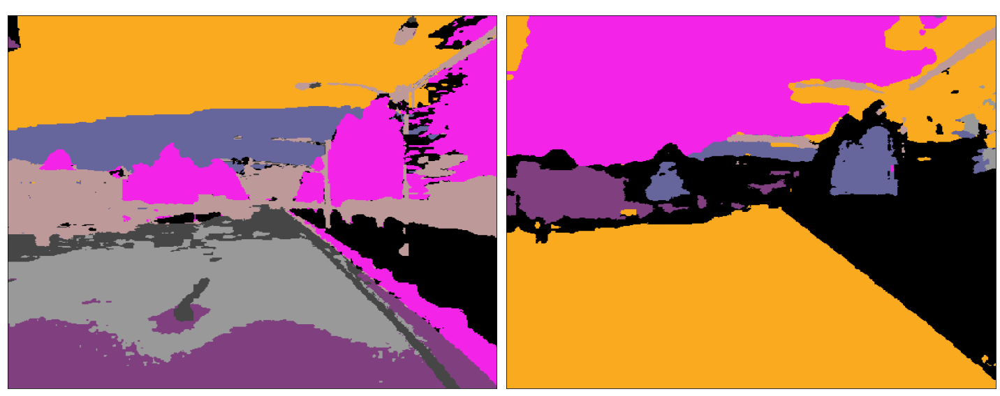

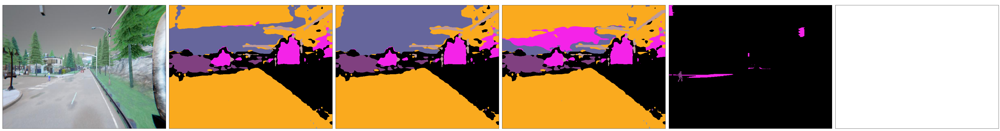

In [23]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image

# Your function definitions for get_transform, unnorm, and remove_axes here

# Define unified colormap
CARLA_LABELS = {
    0: (0, 0, 0),        # Unlabeled
    1: (128, 64, 128),   # Roads
    2: (244, 35, 232),   # SideWalks
    3: (70, 70, 70),     # Building
    4: (102, 102, 156),  # Wall
    5: (190, 153, 153),  # Fence
    6: (153, 153, 153),  # Pole
    7: (250, 170, 30),   # TrafficLight
    8: (220, 220, 0),    # TrafficSign
    9: (107, 142, 35),   # Vegetation
    10: (152, 251, 152), # Terrain
    11: (70, 130, 180),  # Sky
    12: (220, 20, 60),   # Pedestrian
    13: (255, 0, 0),     # Rider
    14: (0, 0, 142),     # Car
    15: (0, 0, 70),      # Truck
    16: (0, 60, 100),    # Bus
    17: (0, 60, 100),    # Train
    18: (0, 0, 230),     # Motorcycle
    19: (119, 11, 32),   # Bicycle
    20: (110, 190, 160), # Static
    21: (170, 120, 50),  # Dynamic
    22: (55, 90, 80),    # Other
    23: (45, 60, 150),   # Water
    24: (157, 234, 50),  # RoadLine
    25: (81, 0, 81),     # Ground
    26: (150, 100, 100), # Bridge
    27: (230, 150, 140), # RailTrack
    28: (180, 165, 180), # GuardRail
}

CITYSCAPES_LABELS = {
    0: (0, 0, 0),        # Unlabeled
    1: (128, 64, 128),   # Roads
    2: (244, 35, 232),   # SideWalks
    3: (70, 70, 70),     # Building
    4: (102, 102, 156),  # Wall
    5: (190, 153, 153),  # Fence
    6: (153, 153, 153),  # Pole
    7: (250, 170, 30),   # TrafficLight
    8: (220, 220, 0),    # TrafficSign
    9: (107, 142, 35),   # Vegetation
    10: (152, 251, 152), # Terrain
    11: (70, 130, 180),  # Sky
    12: (220, 20, 60),   # Pedestrian
    13: (255, 0, 0),     # Rider
    14: (0, 0, 142),     # Car
    15: (0, 0, 70),      # Truck
    16: (0, 60, 100),    # Bus
    17: (0, 60, 100),    # Train
    18: (0, 0, 230),     # Motorcycle
    19: (119, 11, 32),   # Bicycle
}

# Combine the two colormaps (assume they are already consistent)
combined_colormap = {**CARLA_LABELS, **CITYSCAPES_LABELS}

# Function to apply colormap
def apply_colormap(pred, colormap):
    colored_image = np.zeros((pred.shape[0], pred.shape[1], 3), dtype=np.uint8)
    for label, color in colormap.items():
        mask = pred == label
        for i in range(3):
            colored_image[:, :, i][mask] = color[i]
    return colored_image

j = 28
i = 239
# Load and transform the images
img_path = '../dataloader_test/v2/small_800-400_R07/imgs/train/train_'+ str(j)+ '_'+ str(i)+ '_bird_view_frame_RGB.jpg'
img = Image.open(img_path)
og_img = img

transform = get_transform(448, False, "center")
img = transform(img).unsqueeze(0).cuda()


gt_img_path = '../dataloader_test/v2/small_800-400_R07/labels/train/lab_train_'+ str(j)+ '_'+ str(i)+'_bird_view_frame_SEG.png'
gt_img = Image.open(gt_img_path)
og_gt = gt_img

# gt_img_red_channel = np.array(gt_img)[:, :, 0]
gt_img = transform(gt_img).unsqueeze(0).cpu()

# Make predictions
with torch.no_grad():
    code1 = model(img)
    code2 = model(img.flip(dims=[3]))
    code = (code1 + code2.flip(dims=[3])) / 2
    code = F.interpolate(code, img.shape[-2:], mode='bilinear', align_corners=False)
    linear_probs = torch.log_softmax(model.linear_probe(code), dim=1).cpu()
    cluster_probs = model.cluster_probe(code, 2, log_probs=True).cpu()

    single_img = img[0].cpu()
    linear_pred = dense_crf(single_img, linear_probs[0]).argmax(0)
    cluster_pred = dense_crf(single_img, cluster_probs[0]).argmax(0)

# Combine predictions using different methods
def combine_predictions_logarithmic(linear_probs, cluster_probs):
    combined_probs = torch.log((torch.exp(linear_probs) + torch.exp(cluster_probs)) / 2)
    return combined_probs.argmax(0)

def combine_predictions_geometric_mean(linear_probs, cluster_probs):
    combined_probs = torch.sqrt(torch.exp(linear_probs) * torch.exp(cluster_probs))
    return torch.log(combined_probs).argmax(0)

def combine_predictions_ensemble(linear_probs, cluster_probs):
    linear_confidence = torch.max(linear_probs, dim=0)[0]
    cluster_confidence = torch.max(cluster_probs, dim=0)[0]
    combined_pred = torch.where(linear_confidence > cluster_confidence, linear_probs.argmax(0), cluster_probs.argmax(0))
    return combined_pred

# Calculate IoU
def calculate_iou(pred, gt):
    intersection = np.logical_and(pred, gt)
    union = np.logical_or(pred, gt)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

# Assuming gt_img is your ground truth image in the same format as predictions
gt_img_np = np.array(gt_img.squeeze(0)).astype(np.int32)  # Ensure correct dimensions and type

linear_iou = calculate_iou(linear_pred, gt_img_np)
cluster_iou = calculate_iou(cluster_pred, gt_img_np)

combined_pred_logarithmic = combine_predictions_logarithmic(linear_probs[0], cluster_probs[0])
combined_pred_geometric_mean = combine_predictions_geometric_mean(linear_probs[0], cluster_probs[0])
combined_pred_ensemble = combine_predictions_ensemble(linear_probs[0], cluster_probs[0])

combined_iou_logarithmic = calculate_iou(combined_pred_logarithmic.numpy(), gt_img_np)
combined_iou_geometric_mean = calculate_iou(combined_pred_geometric_mean.numpy(), gt_img_np)
combined_iou_ensemble = calculate_iou(combined_pred_ensemble.numpy(), gt_img_np)

print(f"Linear Probe IoU: {linear_iou}")
print(f"Cluster Probe IoU: {cluster_iou}")
print(f"Combined IoU (Logarithmic): {combined_iou_logarithmic}")
print(f"Combined IoU (Geometric Mean): {combined_iou_geometric_mean}")
print(f"Combined IoU (Ensemble): {combined_iou_ensemble}")

# Convert predictions to color images using the unified colormap
linear_pred_colored = apply_colormap(linear_pred, combined_colormap)
cluster_pred_colored = apply_colormap(cluster_pred, combined_colormap)
combined_pred_logarithmic_colored = apply_colormap(combined_pred_logarithmic.numpy(), combined_colormap)
combined_pred_geometric_mean_colored = apply_colormap(combined_pred_geometric_mean.numpy(), combined_colormap)
combined_pred_ensemble_colored = apply_colormap(combined_pred_ensemble.numpy(), combined_colormap)
print(gt_img_np[0].shape) # being: (3, 448, 448)
gt_img_colored = apply_colormap(gt_img_np[0], combined_colormap)

# Plotting the results
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

# Cluster predictions
ax[0].imshow(cluster_pred_colored, aspect='auto')
ax[0].set_title("Cluster Predictions", color='white')

# Linear probe predictions
ax[1].imshow(linear_pred_colored, aspect='auto')
ax[1].set_title("Linear Probe Predictions", color='white')

remove_axes(ax)

# Adjust layout
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 6, figsize=(60, 8))

ax[0].imshow(og_img, aspect='auto')
ax[0].set_title("Image", color='white')

# Combined predictions
ax[1].imshow(combined_pred_logarithmic_colored, aspect='auto')
ax[1].set_title("Combined Predictions (Logarithmic)", color='white')

ax[2].imshow(combined_pred_geometric_mean_colored, aspect='auto')
ax[2].set_title("Combined Predictions (Geometric Mean)", color='white')

ax[3].imshow(combined_pred_ensemble_colored, aspect='auto')
ax[3].set_title("Combined Predictions (Ensemble)", color='white')

# Original ground truth image
ax[4].imshow(gt_img_colored, aspect='auto')
ax[4].set_title("Ground Truth", color='white')

# Remove the axes for a cleaner look
remove_axes(ax)

# Adjust layout
plt.tight_layout()
plt.show()


NameError: name 'combined_pred' is not defined

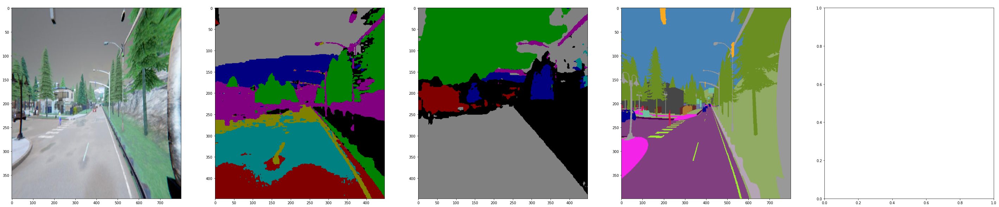

In [24]:
def calculate_pixelwise_iou(pred, gt):
    # Calculate IoU for each pixel by comparing the predicted and ground truth labels
    intersection = np.logical_and(pred == gt, gt != 0)
    union = np.logical_or(pred != 0, gt != 0)
    iou = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0
    return iou

def calculate_pixelwise_iou_matrix(pred, gt):
    # Calculate IoU for each class and each pixel
    h, w = pred.shape
    iou_matrix = np.zeros((h, w))
    for y in range(h):
        for x in range(w):
            iou_matrix[y, x] = calculate_pixelwise_iou(pred[y, x], gt[y, x])
    return iou_matrix

def calculate_pixelwise_iou(pred, gt):
    # Calculate IoU for each pixel by comparing the predicted and ground truth labels
    intersection = np.logical_and(pred == gt, gt != 0)
    union = np.logical_or(pred != 0, gt != 0)
    iou = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0
    return iou

def calculate_pixelwise_iou_matrix(pred, gt):
    # Calculate IoU for each class and each pixel
    h, w = pred.shape
    iou_matrix = np.zeros((h, w))
    for y in range(h):
        for x in range(w):
            iou_matrix[y, x] = calculate_pixelwise_iou(pred[y, x], gt[y, x])
    return iou_matrix

# Visualize the final product
fig, ax = plt.subplots(1, 5, figsize=(50, 10))

ax[0].imshow(og_img, aspect='auto')
ax[0].set_title("Image", color='white')

ax[1].imshow(model.label_cmap[cluster_pred], aspect='auto')
ax[1].set_title("Cluster Predictions", color='white')

ax[2].imshow(model.label_cmap[linear_pred], aspect='auto')
ax[2].set_title("Linear Probe Predictions", color='white')

ax[3].imshow(og_gt, aspect='auto')
ax[3].set_title("Ground Truth", color='white')

ax[4].imshow(model.label_cmap[combined_pred], aspect='auto')
ax[4].set_title("Final Combined Predictions", color='white')

remove_axes(ax)
plt.tight_layout()
plt.show()


NameError: name 'combined_pred' is not defined

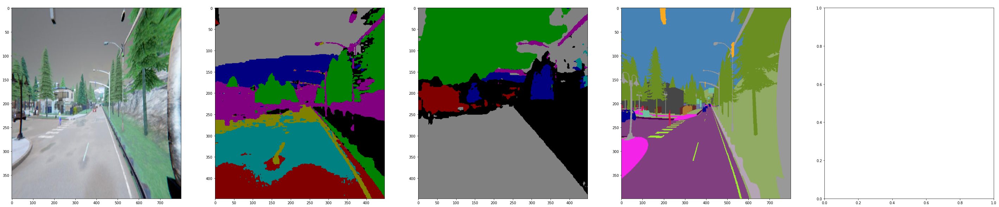

In [25]:
# Visualization
fig, ax = plt.subplots(1, 5, figsize=(50, 10))

cluster_pred = cluster_pred.squeeze()
linear_pred = linear_pred.squeeze()


ax[0].imshow(og_img, aspect='auto')
ax[0].set_title("Image", color='white')

ax[1].imshow(model.label_cmap[cluster_pred], aspect='auto')
ax[1].set_title("Cluster Predictions", color='white')

ax[2].imshow(model.label_cmap[linear_pred], aspect='auto')
ax[2].set_title("Linear Probe Predictions", color='white')

ax[3].imshow(og_gt, aspect='auto')
ax[3].set_title("Ground Truth", color='white')

ax[4].imshow(model.label_cmap[combined_pred], aspect='auto')
ax[4].set_title("Final Combined Predictions", color='white')

remove_axes(ax)
plt.tight_layout()
plt.show()
